<p style="text-align:center">
    <a href="https://skills.network/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMDeveloperSkillsNetworkML0101ENSkillsNetwork20718538-2022-01-01">
    <img src="https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/assets/logos/SN_web_lightmode.png" width="200" alt="Skills Network Logo"  />
    </a>
</p>

<h1 align="center"><font size="5">Unpervised Machine Learning - Final Assignment</font></h1>


## Task:

One of the main objectives of this course is to help you gain hands-on experience in communicating insightful and impactful findings to stakeholders. In this project you will use the tools and techniques you learned throughout this course to develop a few clustering models or dimension reduction transformations on a data set that you feel passionate about. Then, you will select the algorithm that best suits your needs, and communicate insights you found from your clustering or dimension reduction exercise.

After going through some guided steps, you will have insights that either group similar observations together or explain a data set in a projection of less dimensions.

Alternatively, you can revisit a Supervised Learning (regression or classification) model and confirm whether it is best to have one model for your entire data set, or to have one model for each cluster of your data set.

As a main deliverable, you will submit a report that helps you focus on highlighting your analytical skills, thought process, and next steps.

## Import the required libraries


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import label_binarize, MinMaxScaler,StandardScaler

from sklearn.svm import SVC
from sklearn.decomposition import PCA, KernelPCA, TruncatedSVD
from sklearn.manifold import MDS
from sklearn.cluster import DBSCAN
from sklearn.manifold import TSNE

np.random.seed(42)

## Importing the Dataset

The dataset choosen for this assignement contains of chemical data and parameters of a physical model for different substances.

# 1. About the Data


Read your chosen dataset into pandas dataframe:


In [2]:
data = pd.read_csv('SI_pcp-saft_parameters.csv',sep="\t")
data = data.fillna(0)
data.columns, data.shape

(Index(['common_name', 'iupac_name', 'inchi', 'canonical_smiles',
        'isomeric_smiles', 'cas', 'family', 'molarweight', 'm', 'sigma',
        'epsilon_k', 'mu', 'kappa_ab', 'epsilon_k_ab', 'na', 'nb', 'mard_psat',
        't_min_psat', 't_max_psat', 'points_psat', 'mard_psat_incl_outlier',
        'points_psat_incl_outlier', 'mard_density', 't_min_density',
        't_max_density', 'points_density_liquid',
        'mard_density_liquid_single_phase',
        'points_density_liquid_single_phase', 'mard_density_equi',
        'points_density_equi', 'mard_density_vapor', 'points_density_vapor',
        'opt', 'bounds_violation'],
       dtype='object'),
 (1842, 34))

The dataset contains several columns relevant for the following analysis which can be split into 3 cateories:

physical model parameters (different for every substance):
- m: seqment parameter, represents the molecule length ( float, unitless )
- sigma: bead radius, represents the average radius of a atom in the molecule ( float, angstrom )
- epsilon_k: represents the interaction energy of a atom in the molecule ( float, kelvin )
- kappa_ab: the effective association volume ( float, ? )
- epsilon_k_ab:  the association energy between association sites a and b ( float, kelvin )
- mu: dipole moment ( float, ? )

chemical information (different for every substance):
- molarweight: molarweight of the substance ( float, g/mol )
- na: number of associating sites a ( integer, unitless )
- nb: number of associating sites b ( integer, unitless )

Colums not used for training but maybe for visualisation purposes:
- family: name of the chemical family the substance belongs to ( string )
- opt: info if substance is DIPOLAR, ASSOCIATIVE,... (string)
- bounds_violation: OK, if training of the physical model and resulting parameters are okay, else some iformation (string)

During training we will only use the parameters of the physical model as they should carry all the chemical information (as we will discuss later in this part of the assignment).

The unused columns "family" and "opt" are a classes. We might compare our results with this classification and discuss. The "bounds_violation" column might be useful to investigate outliers.


In [3]:
for x in np.unique(data["family"]):
    no = len( np.array( data[ data["family"] == x] )    )
    print(x, no)
    #if no < 400:
    #    data = data[ data["family"] != x ]
    #    print("deleted: ",x)
    #if no > 1000:
    #    drop = np.random.choice( no-1,no-1000, replace=False )
    #    ii = data[ data["family"] == x].index[drop]
    #    print(len(ii), data.size) 
    #    data = data.drop(ii,axis="index")
    #    print("thinned",x)
    #    print("remaining:", len( np.array( data[ data["family"] == x] )) )

    print("")
    

data = data[ data["family"] != 'Other compounds' ]
print( "deleted Other compounds" )
print( "--> to obtain a smaller dataset and shorter computation times" )
print( "--> reasonable for this initial study/step" )

le0 = LabelEncoder()
data["family"] = le0.fit_transform(data.family)
le = LabelEncoder()
data["opt"] = le.fit_transform(data.opt)

uniq_fam = np.unique( data["family"] )
no_classes = len( uniq_fam )
uniq_fam, no_classes


Acids 33

Alcohols 74

Aldehydes 22

Alkanes 80

Alkenes 68

Alkynes 12

Amines 77

Aromatic hydrocarbons 161

Chlorides 43

Cyclic compounds 75

Elements 9

Esters 113

Ethers 47

Fluorides 41

Halogenated compounds 53

Inorganic compounds 44

Ketones 38

Nitriles 22

Other compounds 623

Polyfunctional compounds 101

Silanes/siloxanes 50

Sulfides/thiophenes 37

Thiols 19

deleted Other compounds
--> to obtain a smaller dataset and shorter computation times
--> reasonable for this initial study/step


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21]),
 22)

The dataset contains molecules of many different families. The largest group is "Other compounds" whereas "Poyfunctional compounds" is also quite large. This shows that classical chemical classification methods reach their limits with large data sets of very different molecules, as complex molecules often cannot be classified uniquely.

### Correlations

In [4]:
# Calculate the correlation values
feature_cols = [
        'molarweight', 'na', 'nb', 'm', 'sigma', 'epsilon_k', 'kappa_ab',
        'epsilon_k_ab', 'mu']


corr_values = data[feature_cols].corr()

# Simplify by emptying all the data below the diagonal
tril_index = np.tril_indices_from(corr_values)

# Make the unused values NaNs
for coord in zip(*tril_index):
    corr_values.iloc[coord[0], coord[1]] = np.NaN
    
# Stack the data and convert to a data frame
corr_values = (corr_values
               .stack()
               .to_frame()
               .reset_index()
               .rename(columns={'level_0':'feature1',
                                'level_1':'feature2',
                                0:'correlation'}))

# Get the absolute values for sorting
corr_values['abs_correlation'] = corr_values.correlation.abs()

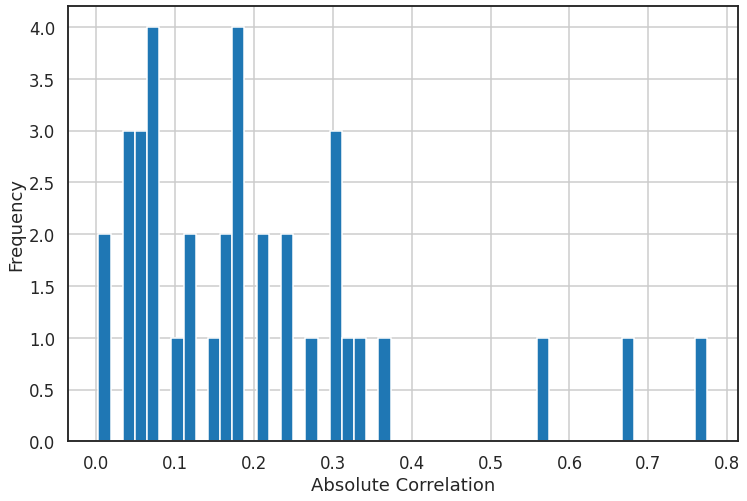

In [5]:
sns.set_context('talk')
sns.set_style('white')

ax = corr_values.abs_correlation.hist(bins=50, figsize=(12, 8))
ax.set(xlabel='Absolute Correlation', ylabel='Frequency');

In [6]:
# The most highly correlated values
corr_values.sort_values('correlation', ascending=False).query('abs_correlation>0.3')

,feature1,feature2,correlation,abs_correlation
19,nb,epsilon_k_ab,0.774564,0.774564
2,molarweight,m,0.678752,0.678752
26,sigma,epsilon_k,0.564936,0.564936
9,na,m,0.369867,0.369867
3,molarweight,sigma,0.310401,0.310401
35,epsilon_k_ab,mu,-0.324509,0.324509
20,nb,mu,-0.328478,0.328478


Checking the correlations provides some interesting insights that partly differ from previous work:

- According to previous work with a different dataset, na, nb and ebsilon_k_ab are expected to be highly correlated. This is expectable when we look at the definitions: ebsilon_k_ab the association energy between association sites a and b, whereas na and nb are the number of association sites a and b. In the new dataset, the number of different species is much higher and associating site numbers vary, therefore they might be more decorrelated now. Still, epsilon_k_ab and kappa_ab are representing those phenomena within the model.

- The correlation between molecularweight and m is expected, correlation between sigma and epsilon_k is not surprising (expected within families). m and sigma together should represent the molecularweight quite well.

- In all other cases the correlation patterns are not that clear. 
 
In the following we will only use the parameters of the physical model during training as they should carry all the chemical information (molarweight, na, nb).

This leads to the following feature columns:


In [7]:
feature_cols = [  'm','sigma', 'epsilon_k', 'kappa_ab', 'epsilon_k_ab', 'mu']

# 2. Goals

In this study we want to apply several unsupervised classification and dimensionality reduction methods to the introduced dataset.

We want to investigate several questions:

- what classification will be found? The dataset offers different options like molecular families, molecule size or chemical features like associating sites or dipoles. Perhaps similar patterns are recognised by an unsupervised clasifier... or unseen ones.
- is it possible (i.e. do the classifications make sense) to classify the species based on the given features i.e. parameters of the physical model?
- if dimensionality reduction is helpful for classification. If yes why?
- if the classes derived from unsupervised classification agree with one of the available "chemical" classes.
- can we deduce from the results how the parameters of the physical model were fitted?

The data set offers various classification options according to family or chemical properties, but also molecular length or weight. It will be interesting to see which criterion the unsupervised classifier follows (or whether it will be a mixture of everything).

This leads to the following steps:

- log transform features if necessary, plot dataset, then scale dataset
- use PCA and kernel PCA to reduce the dimensionality of the dataset
- apply different unsupervised classification methods (we will only apply DBSCAN because we already do dimensionality reduction and dont want the assignment to become endlessly long)


### Transformations

We will log transform skewed features:

In [8]:
log_columns = data[feature_cols].skew().sort_values(ascending=False)
log_columns = log_columns.loc[log_columns > 0.75]

log_columns

kappa_ab        6.660660
m               3.327539
epsilon_k_ab    1.834144
mu              1.386491
dtype: float64

In [9]:
# we save the final dataset used in the following study :)
data.to_csv( 'dataset_cleaned.csv',sep="\t" )
data = pd.read_csv('dataset_cleaned.csv',sep="\t")

for skew in log_columns.index:
    data[skew] = np.log(data[skew]+1)

uniq_fam = np.unique( data["family"] )
no_classes = len( uniq_fam )
uniq_fam, no_classes

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21]),
 22)

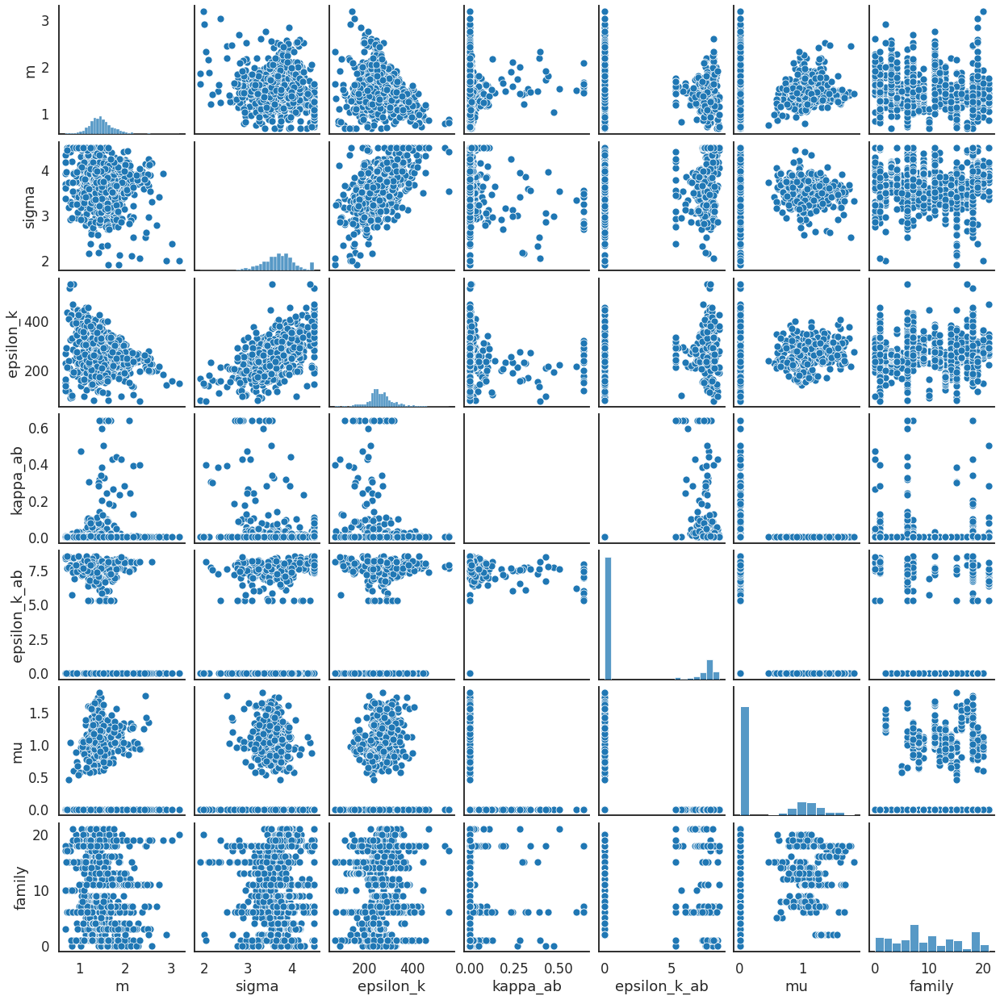

In [10]:
sns.pairplot(data[ feature_cols+["family"] ] ) #, hue='family')

The correlation patterns shows clear but non-trivial patterns with the "family" classification:

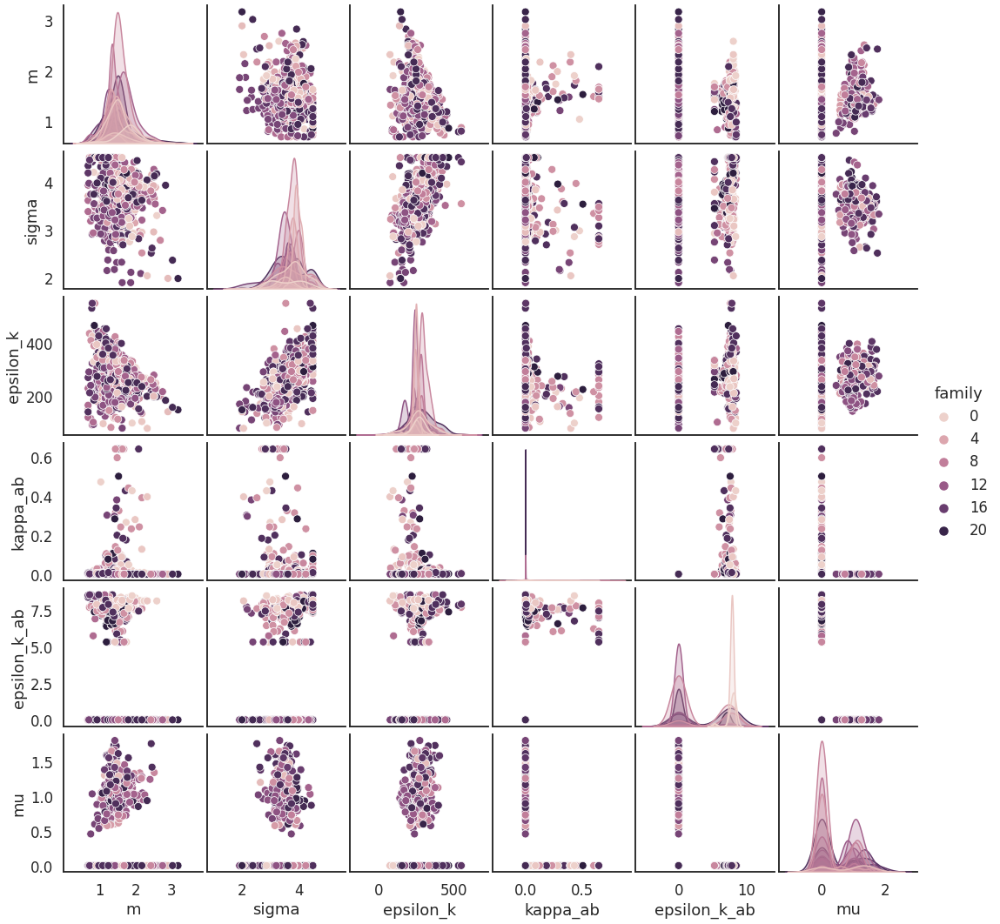

In [11]:
sns.pairplot(data[ feature_cols+["family"] ] , hue='family')

The correlation patterns shows clear but non-trivial patterns with the "opt" classification. DIPOLAR and ASSOCIATIVE substances are clearly separated from the rest of the dataset through epsilon_k_ab and mu. We can already see here that we only need the features epsilon_k_ab and mu to differentiate between DIPOLAR, ASSOCIATIVE and NONPOLAR:

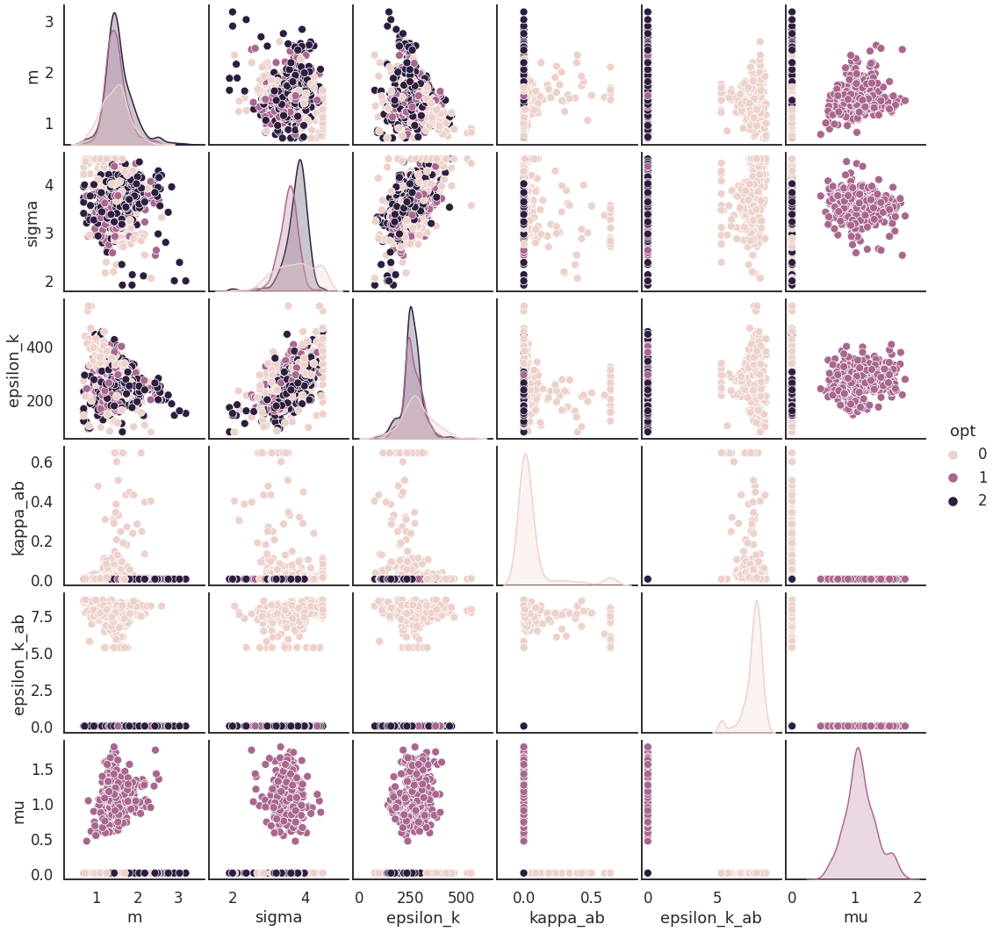

In [12]:
sns.pairplot(data[ feature_cols+["opt"] ] , hue='opt')

### Scaling

Before we start with the training we need to scale our data:

In [13]:
data_train    = data[feature_cols]
scaler  = StandardScaler()
data_train[:] = scaler.fit_transform(data_train)
data_train.columns = [f'{c} (scaled)' for c in data_train.columns]
data_train.head()

/tmp/ipykernel_27317/1061762802.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_train[:] = scaler.fit_transform(data_train)
/tmp/ipykernel_27317/1061762802.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_train[:] = scaler.fit_transform(data_train)


,m (scaled),sigma (scaled),epsilon_k (scaled),kappa_ab (scaled),epsilon_k_ab (scaled),mu (scaled)
0,-1.111513,-1.106065,-0.664660,-0.203731,-0.574592,1.755713
1,-0.488819,-1.367609,1.935909,-0.030449,1.666029,-0.678505
2,-0.930788,-1.259710,-1.009846,-0.203731,-0.574592,2.292070
3,-0.522179,-1.051327,-0.604056,-0.203731,-0.574592,1.849323
4,0.335282,-2.094793,-0.246006,-0.201217,1.532364,-0.678505


In [14]:
"""
some helper funs for visualization:
"""

def visualize_transformed( data, transformed_data, labels, label_name="label", exclude_noise=True ):
    data_dummy  = data.copy()
    data_dummy[label_name] = labels
    data_dummy = data_dummy[ data_dummy[label_name] >= 0 ]
    tdata_dummy = transformed_data.copy()
    tdata_dummy[label_name] = labels
    tdata_dummy = tdata_dummy[ tdata_dummy[label_name] >= 0 ]
    
    sns.pairplot( tdata_dummy , hue=label_name)
    plt.show()
    plt.close()
    
    sns.pairplot( data_dummy , hue=label_name)
    plt.show()
    plt.close()    
    
    return

def visualize( data, labels, label_name="label"):
    data_dummy  = data.copy()
    data_dummy[label_name] = labels
    data_dummy = data_dummy[ data_dummy[label_name] >= 0 ]
    
    sns.pairplot( data_dummy , hue=label_name)
    plt.show()
    plt.close()    
    
    return

# 3. Dimensionality Reduction

Here we will apply PCA and kernel PCA to reduce the dimensionality of our dataset and will also have a short look on SVD:

## PCA

First we will apply PCA. We will reduce the dimensionality by two i.e. derive a 4D parameter space from a 6D parameter space.

In [15]:
n_components = 4
pca = PCA(n_components= n_components )
pca.fit(data_train)

PCA(n_components=4)

In [16]:
Xhat = pca.transform(data_train)
Xhat.shape

(1219, 4)

In [17]:
pca_cols = [f'PC{i+1}' for i in range(n_components)]
data_PCA = pd.DataFrame(columns=pca_cols, data=Xhat)
data_PCA.head()

,PC1,PC2,PC3,PC4
0,-1.364972,-1.116951,-1.743194,0.218396
1,1.194754,1.014878,-0.823357,-0.412225
2,-1.873815,-1.255291,-1.861097,0.018095
3,-1.516971,-1.109357,-1.322708,-0.178037
4,-0.788730,1.512076,-0.157999,0.384072


The different PC dimensions are quite decorrelated:

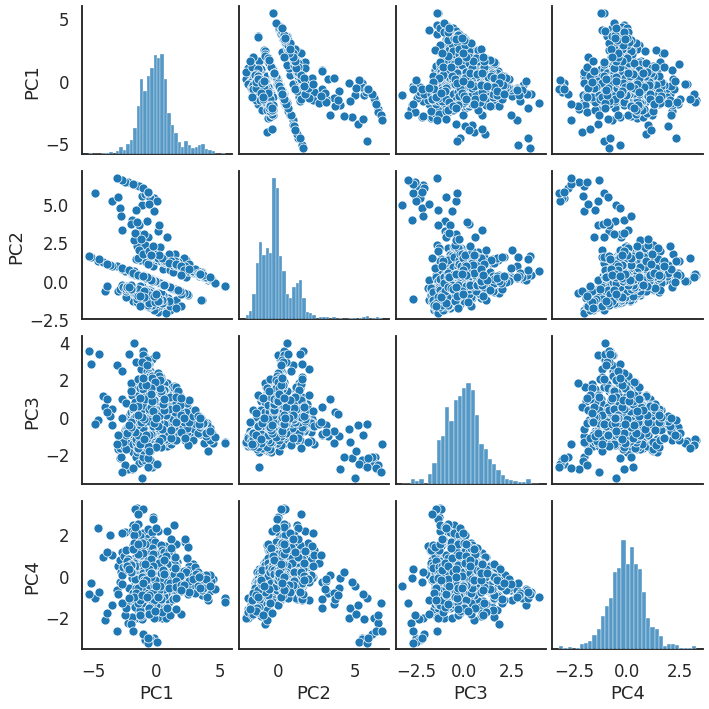

In [18]:
sns.pairplot(data_PCA)
plt.show()

In [19]:
data_PCA.corr().style.background_gradient(cmap='coolwarm')

,PC1,PC2,PC3,PC4
PC1,1.000000,0.000000,-0.000000,0.000000
PC2,0.000000,1.000000,-0.000000,-0.000000
PC3,-0.000000,-0.000000,1.000000,-0.000000
PC4,0.000000,-0.000000,-0.000000,1.000000


If we colour the PCs using the parameters of the original parameters, we can see that the patterns of the original parameters are visible in the reduced data set:

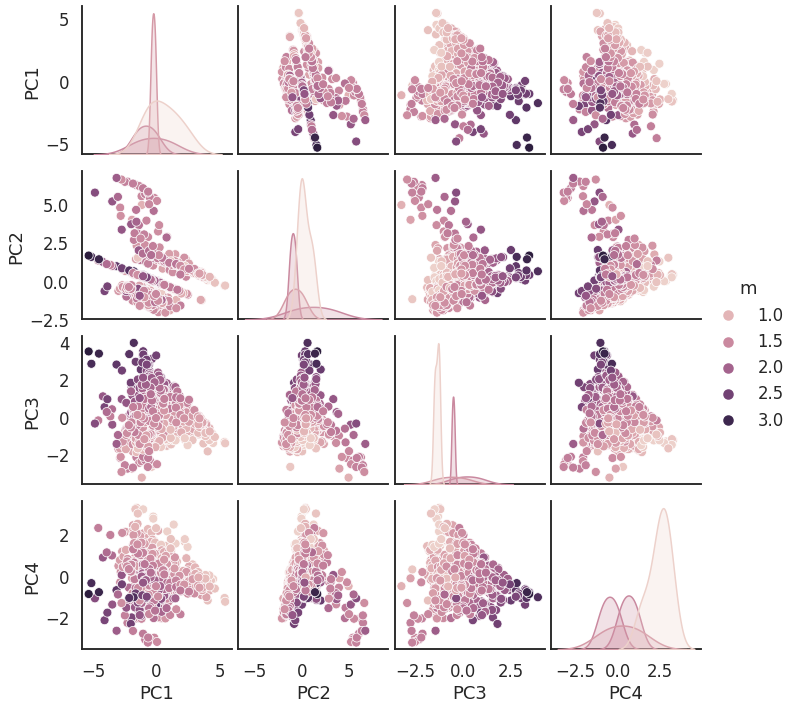

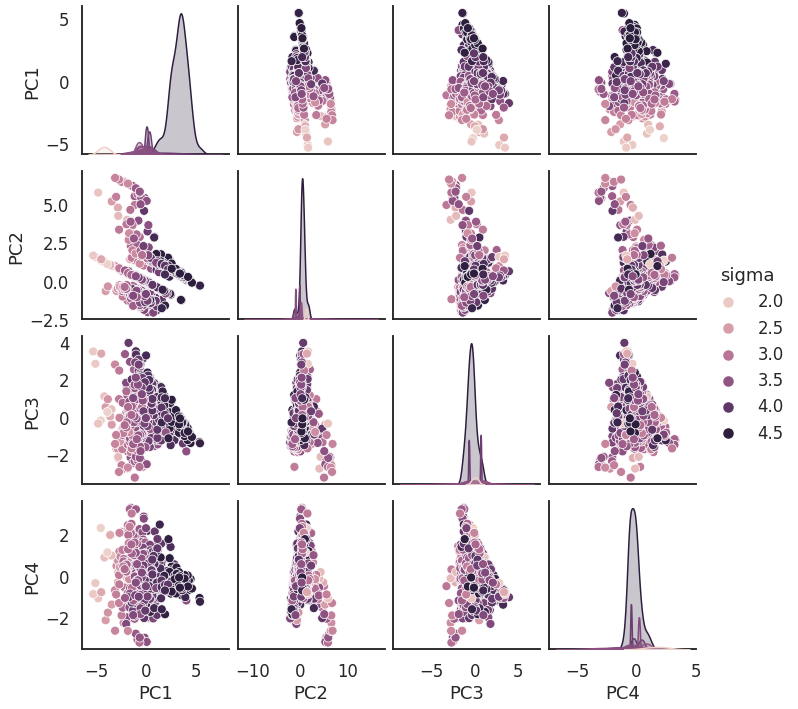

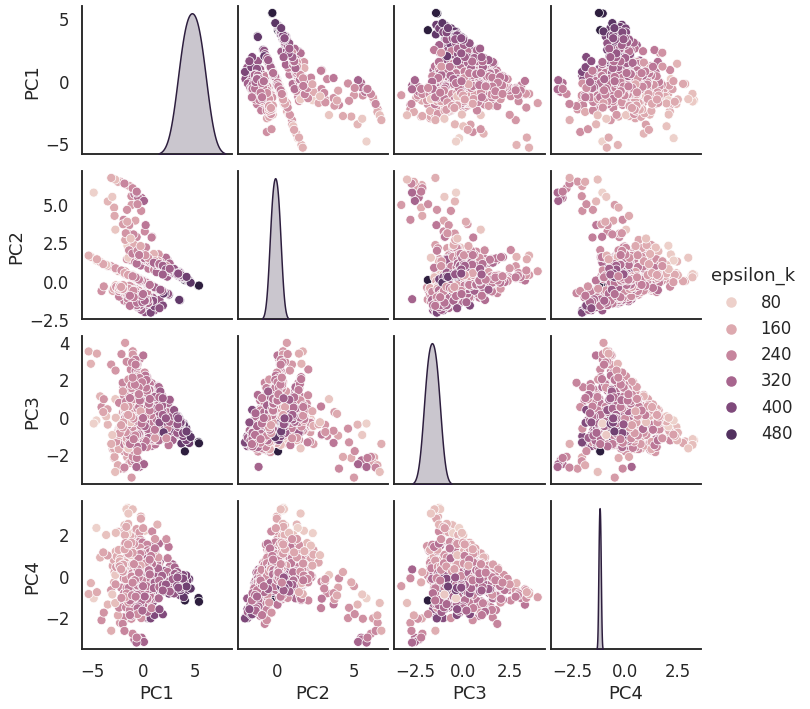

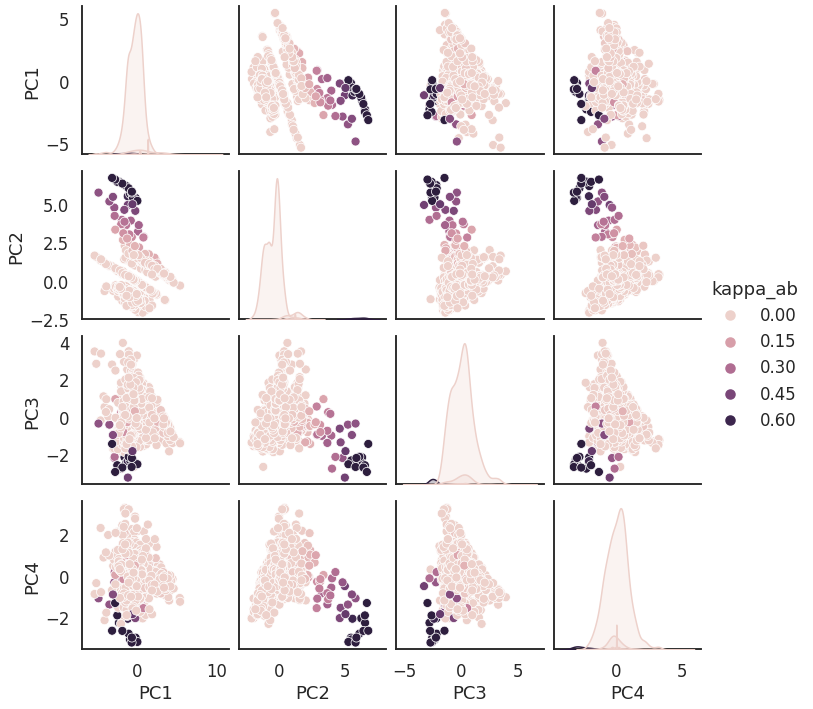

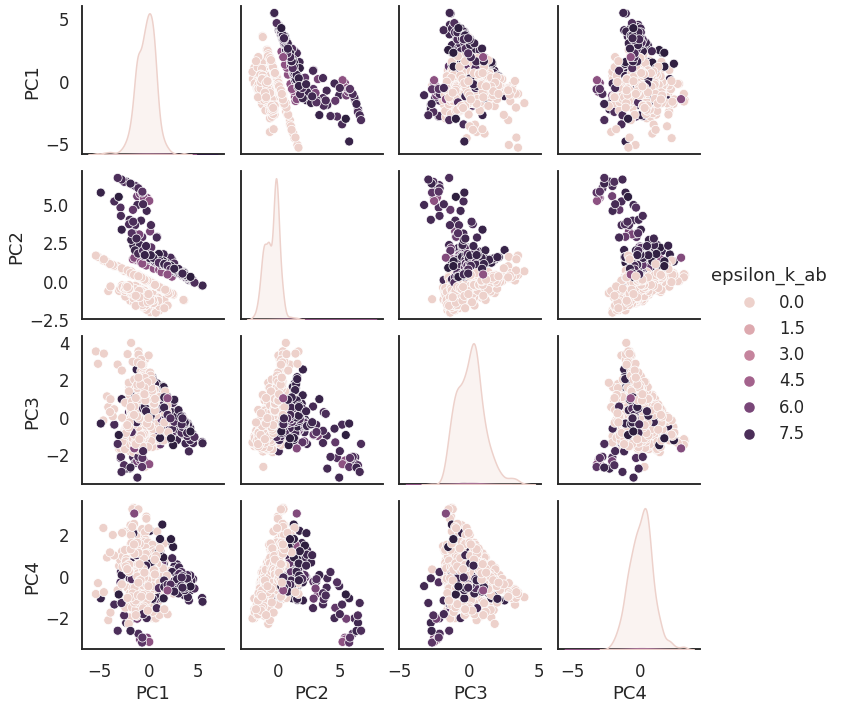

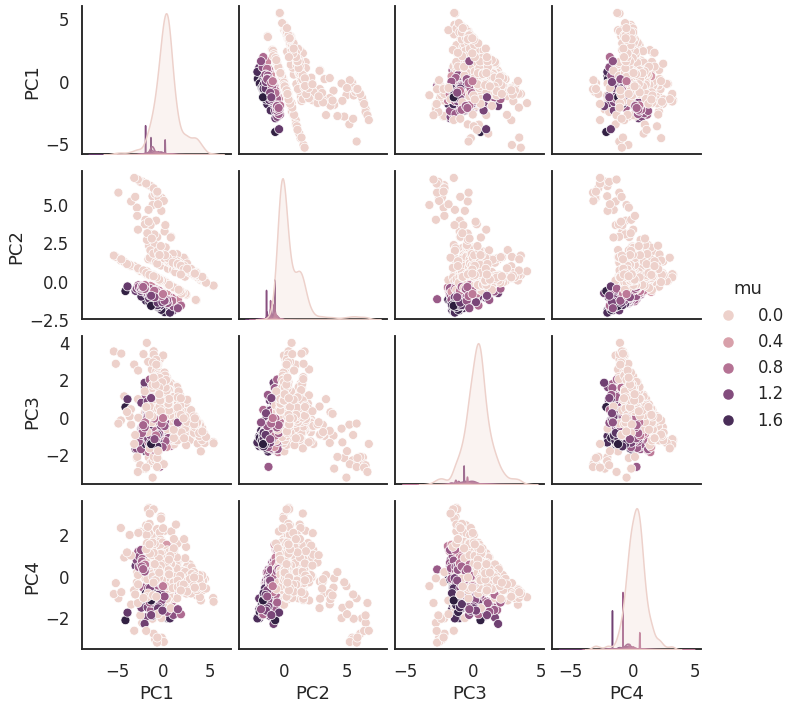

In [20]:
for key in feature_cols:
    visualize( data_PCA, data[key], label_name=key )

## Kernel PCA

In [21]:
n_components = 4
kernel_pca = KernelPCA( kernel="rbf", gamma=0.3, fit_inverse_transform=True, alpha=0.01, n_components=n_components)
kernel_pca.fit(data_train)

KernelPCA(alpha=0.01, fit_inverse_transform=True, gamma=0.3, kernel='rbf',
          n_components=4)

In [22]:
Xhat_kPCA = kernel_pca.transform(data_train)
Xhat_kPCA.shape

(1219, 4)

In [23]:
kpca_cols = [f'kPC{i+1}' for i in range(n_components)]
data_kPCA = pd.DataFrame(columns=kpca_cols, data=Xhat_kPCA)
data_kPCA.head()

,kPC1,kPC2,kPC3,kPC4
0,0.471910,-0.140411,-0.063590,0.238708
1,0.119711,0.364022,-0.049629,0.010087
2,0.413622,-0.021087,0.004006,0.177544
3,0.561660,-0.235196,0.013127,0.202445
4,0.133248,0.429086,0.045319,0.172214


The different kernel PC dimensions are quite decorrelated but we also see some "islands" which might be useful for classification:

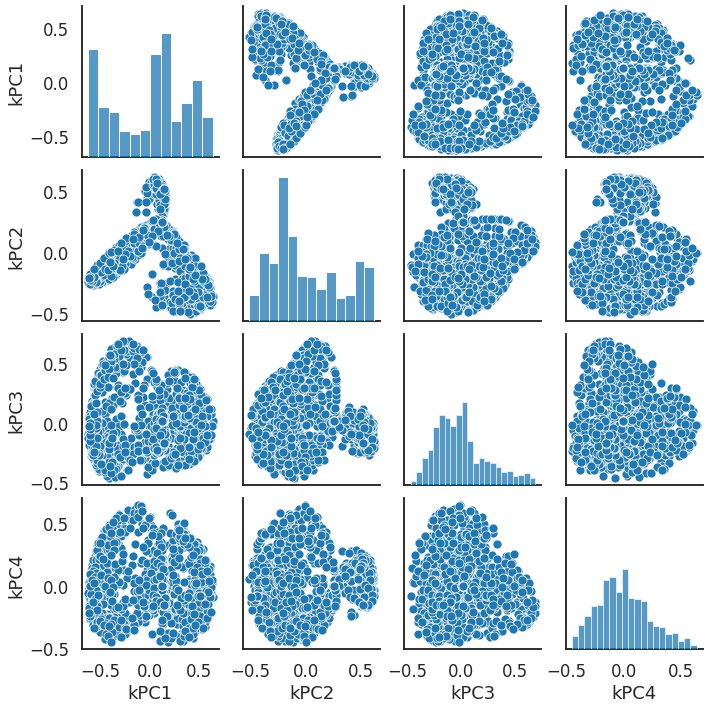

In [24]:
sns.pairplot(data_kPCA)
plt.show()

If we colour the PCs using the parameters of the original parameters, we can see that the patterns of the original parameters are visible in the reduced data set. Especially the features epsilon_k_ab and mu are clearly marked out. Theredore an unsupervised classifier is to be expected to differentiate between DIPOLAR, ASSOCIATIVE and NONPOLAR :

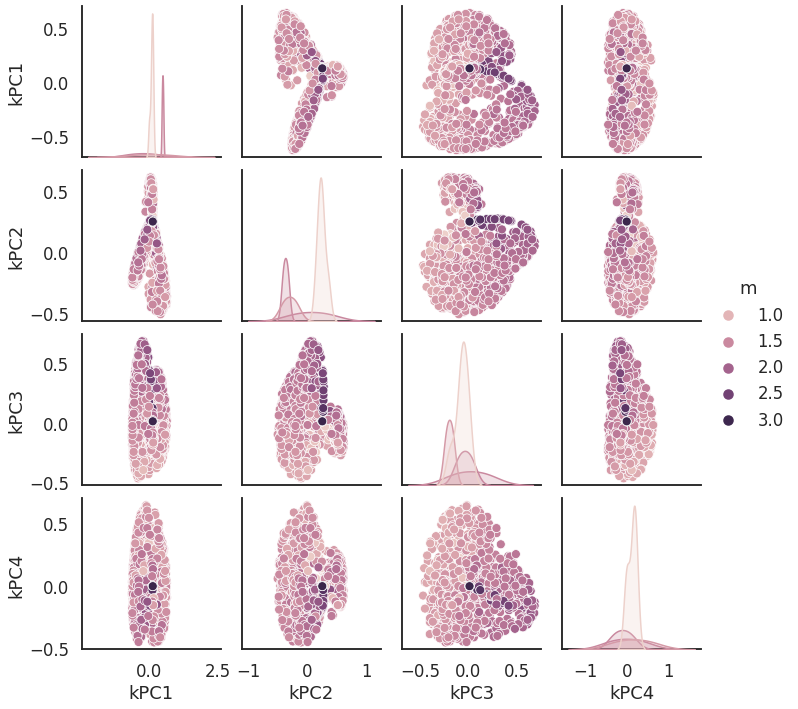

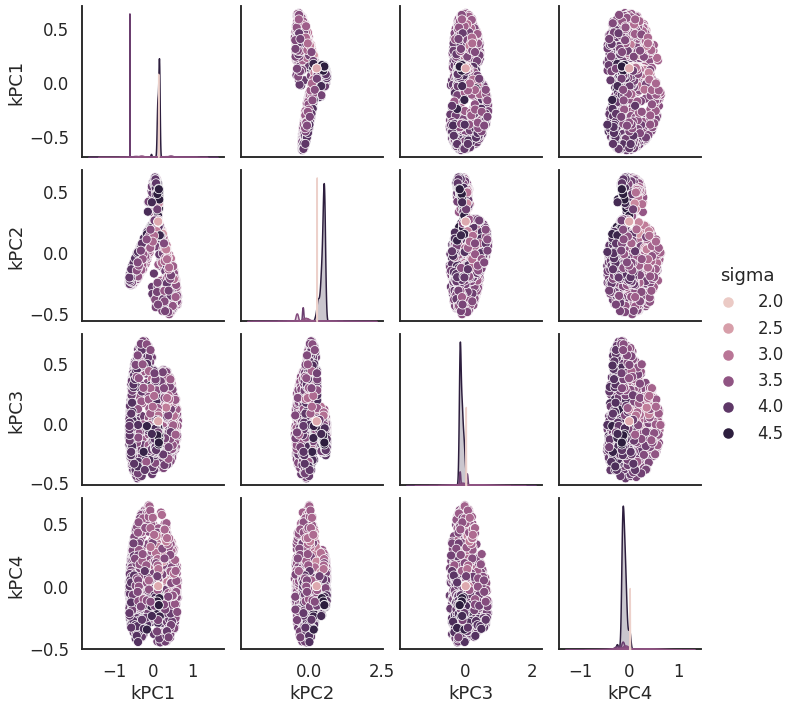

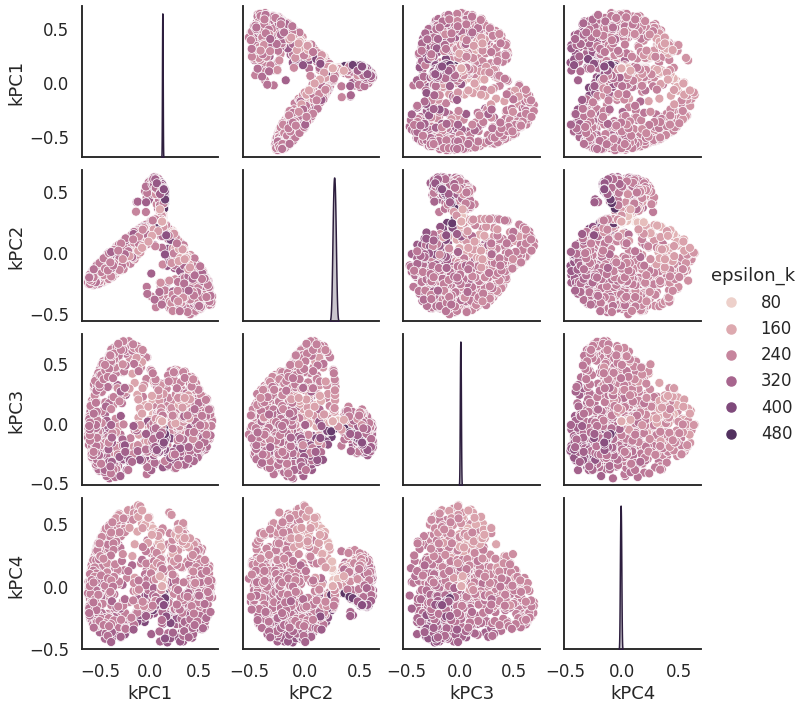

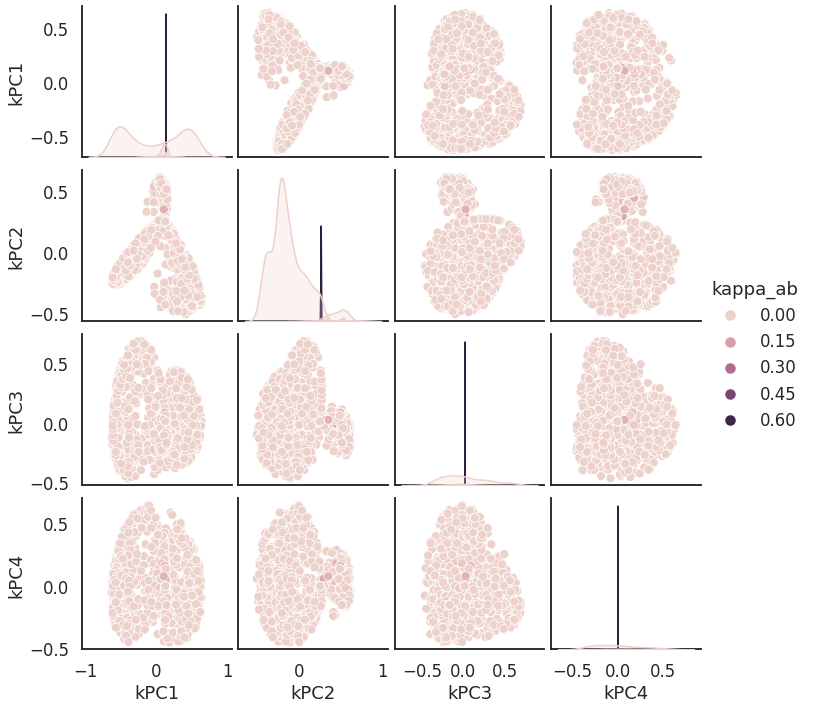

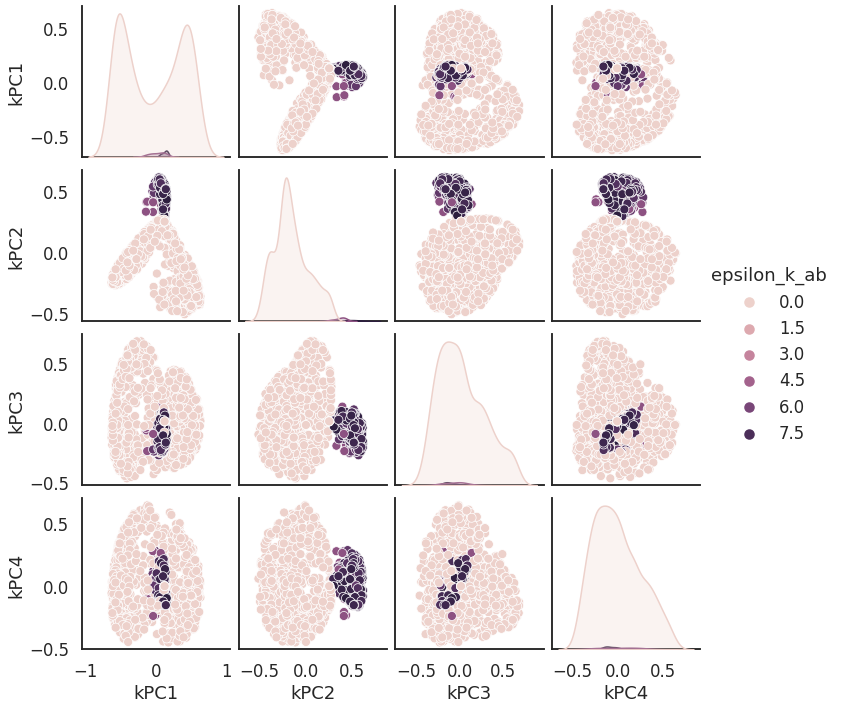

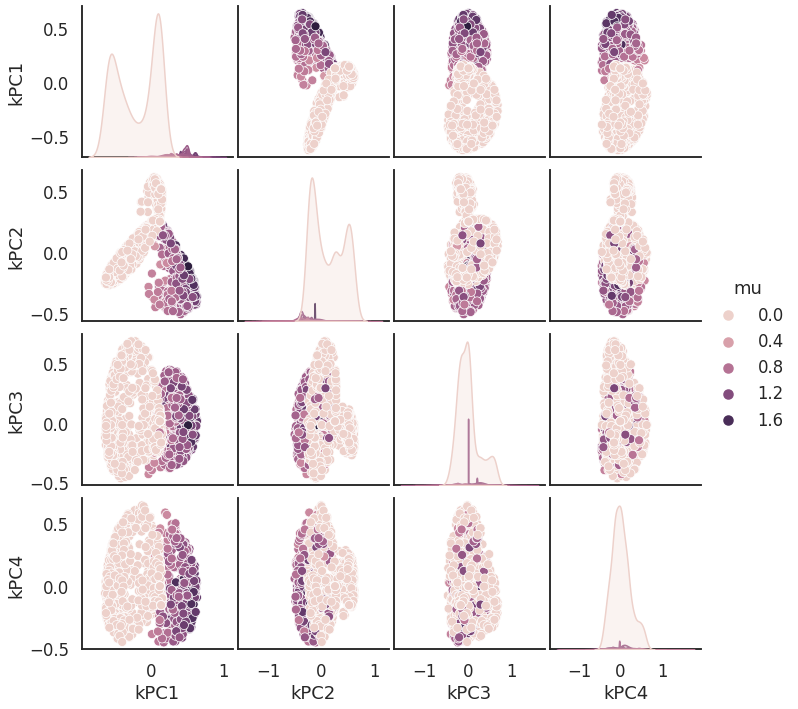

In [25]:
for key in feature_cols:
    visualize( data_kPCA, data[key], label_name=key )

## SVD

Leads to basically the same results as PCA... which is somehow to be expected.

In [26]:
svd_ = TruncatedSVD(n_components=n_components, random_state=42)
Xhat_SVD = svd_.fit_transform(data_train)

In [27]:
svd_cols = [f'PC{i+1}' for i in range(n_components)]
data_SVD = pd.DataFrame(columns=svd_cols, data=Xhat_SVD)
data_SVD.head()

,PC1,PC2,PC3,PC4
0,-1.364972,-1.116951,-1.743194,0.218396
1,1.194754,1.014878,-0.823357,-0.412225
2,-1.873815,-1.255291,-1.861097,0.018095
3,-1.516971,-1.109357,-1.322708,-0.178037
4,-0.788730,1.512076,-0.157999,0.384072


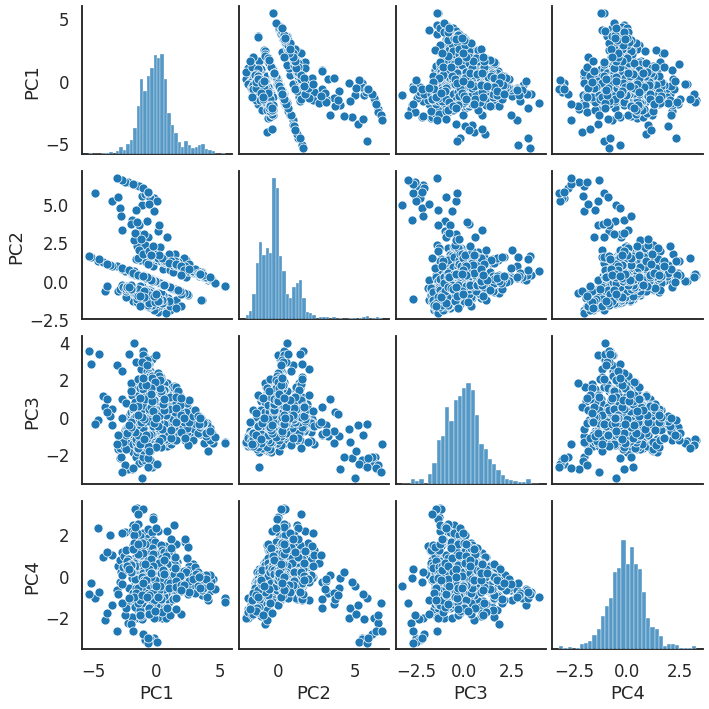

In [28]:
sns.pairplot(data_SVD)
plt.show()

# 4. Classification

Now let's take a look at a classification method. We will limit ourselves to DBSCAN so as not to prolong the assignment too much.

NOISE will not be visualized to obtain clearer representations of the classification results.


## DBSCAN

In [29]:
cluster = DBSCAN(eps=1.0, min_samples=20,metric='euclidean')
cluster.fit(data_train)
print(f'DBSCAN found {len(set(cluster.labels_) - set([-1]))} clusters and {(cluster.labels_ == -1).sum()} points of noise.')
for lab in np.unique(cluster.labels_):
    print( f'{len( cluster.labels_[cluster.labels_==lab] )} datapoints in cluster {lab}' )


DBSCAN found 3 clusters and 132 points of noise.
132 datapoints in cluster -1
387 datapoints in cluster 0
474 datapoints in cluster 1
226 datapoints in cluster 2


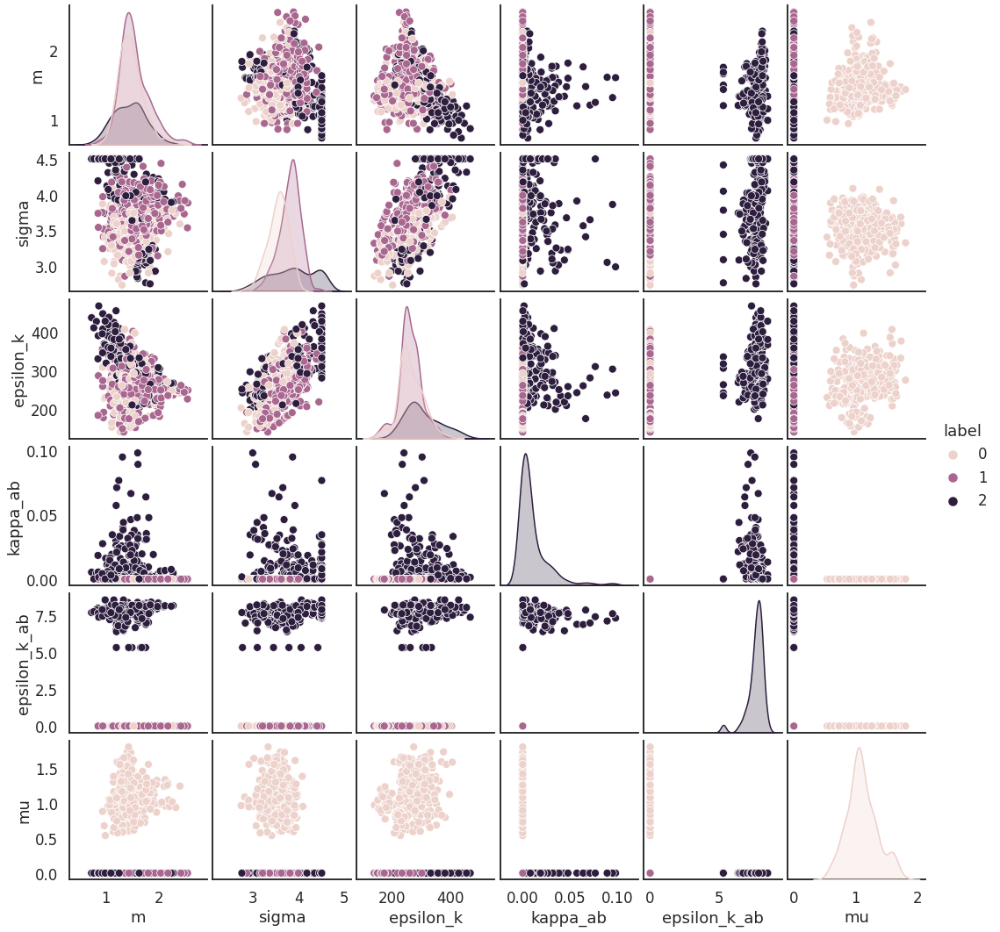

In [30]:
visualize( data[feature_cols], cluster.labels_ )

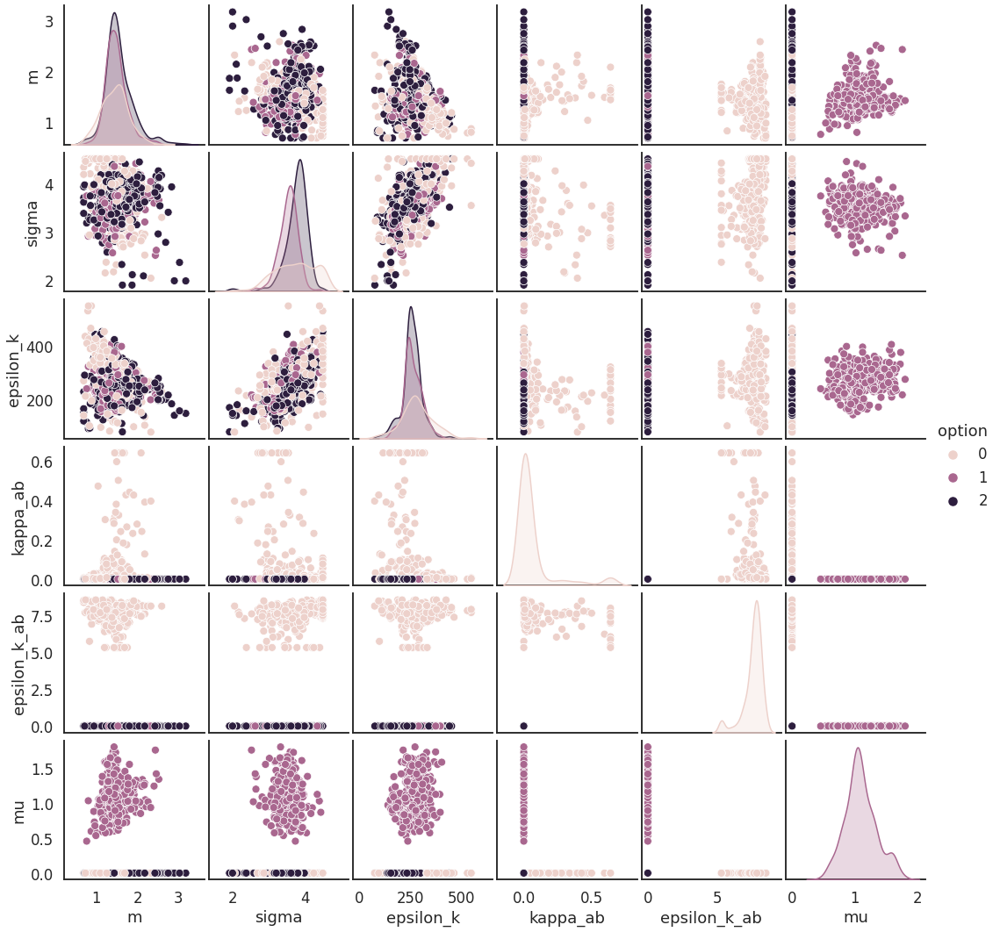

In [31]:
visualize( data[feature_cols],  data.opt, label_name='option' )

The unsupervised classification makes perfect sense. The model disinguishes between DIPOLAR, ASSOCIATIVE and NONPOLAR. However, the results are heavily dependent on the hyperparameters of the classifier. This is quite expected, but the tuning is extremely shaky in this example (curse of high dimensionality).

Small changes can lead to significant changes in the result, which is undesirable in this form as it means that additional data points require re-tuning.

Therefore we want to look at DBSCAN in the kernel PCA reduced subspace. We pursue two goals here:

- maybe we get a more robust classifier that is not very sensitive to hyperparameters
- if the classification result obtained on the manifold is close to the result in the main space we know that all necessary information from the super space is still available in the manifold. This means that we have reasonably manifolded our data :)

## DBSCAN + PCA

In [32]:
cluster_PCA = DBSCAN(eps=0.6, min_samples=20,metric='euclidean')
cluster_PCA.fit(data_PCA)
print(f'DBSCAN found {len(set(cluster_PCA.labels_) - set([-1]))} clusters and {(cluster_PCA.labels_ == -1).sum()} points of noise.')
for lab in np.unique(cluster_PCA.labels_):
    print( f'{len( cluster_PCA.labels_[cluster_PCA.labels_==lab] )} datapoints in cluster {lab}' )
    

DBSCAN found 4 clusters and 304 points of noise.
304 datapoints in cluster -1
335 datapoints in cluster 0
435 datapoints in cluster 1
51 datapoints in cluster 2
94 datapoints in cluster 3


The classifier finds five classes:

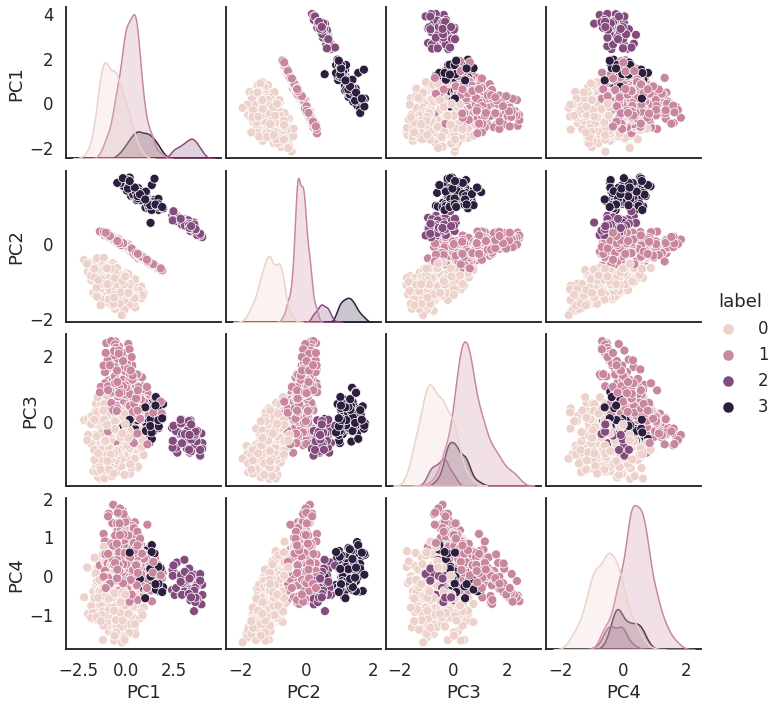

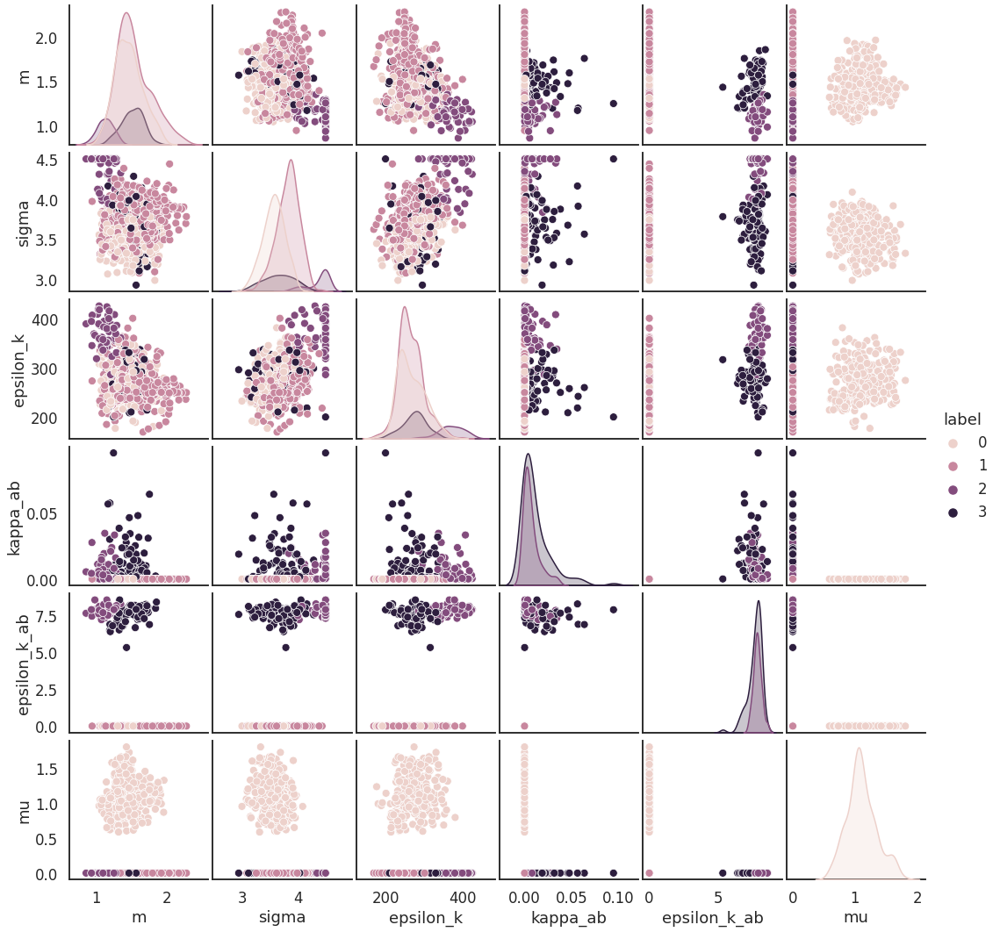

In [33]:
visualize_transformed( data[feature_cols], data_PCA, cluster_PCA.labels_ )

The classification does not represent chemical families. This was to be expected as this classification is probably quite useless as discussed in the beginning.

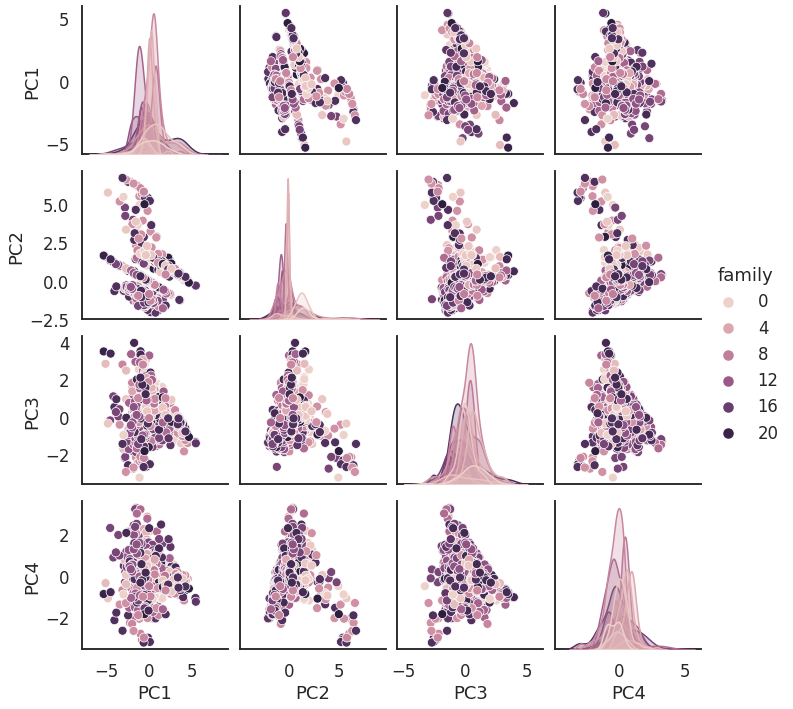

In [34]:
visualize( data_PCA, data.family, label_name='family' )

DIPOLAR, ASSOCIATIVE and NONPOLAR are represented through one or more of the nwe classes.

- DIPOLAR is represented by class 0.
- NONPOLAR is represented by class 1.
- ASSOCIATIVE is represented by classes 2, 3 and 4.

That's a cool result. The rather rough classification according to DIPOLAR, ASSOCIATIVE and NONPOLAR is refined and one of the three classes is divided into subclasses that can be analysed in more detail.
The class that is subdivided is the one that is most widely distributed in the subspace.

If we increase eps, we reduce the noise but also the number of ASSOCIATIVE subclasses. Finally we end up with 3 unsupervised classes: DIPOLAR, ASSOCIATIVE and NONPOLAR. In this example, however, the representation of the possibility of finding subclasses was more important to us than a reproduction of the three classes.

In [35]:
le.inverse_transform([0,1,2])

array(['ASSOCIATIVE', 'DIPOLAR', 'NONPOLAR'], dtype=object)

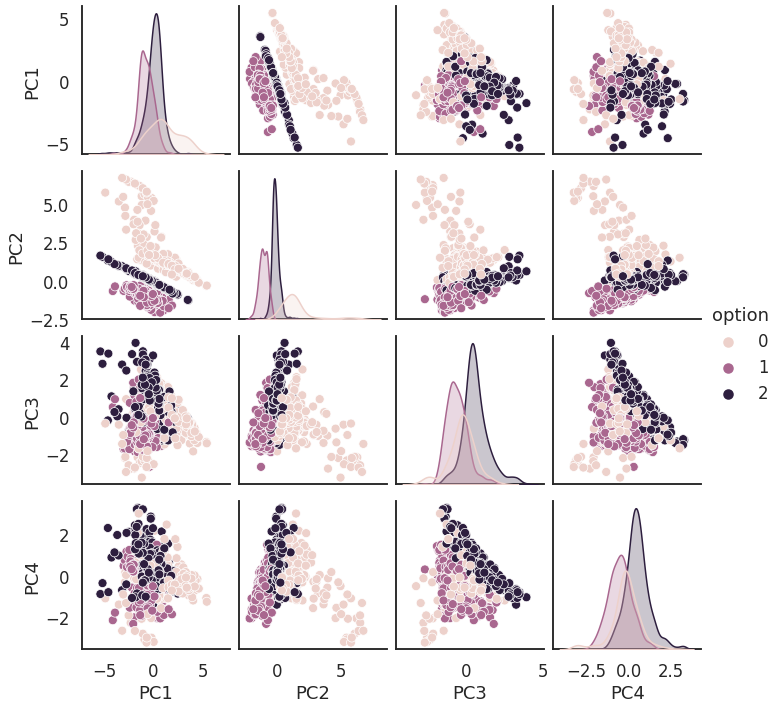

In [36]:
visualize( data_PCA, data.opt, label_name='option' )

The subdivision of could either be based on parameters representing the size of the molecule or on kappa_ab which reflects the association volume. There is evidence for both in the plots:

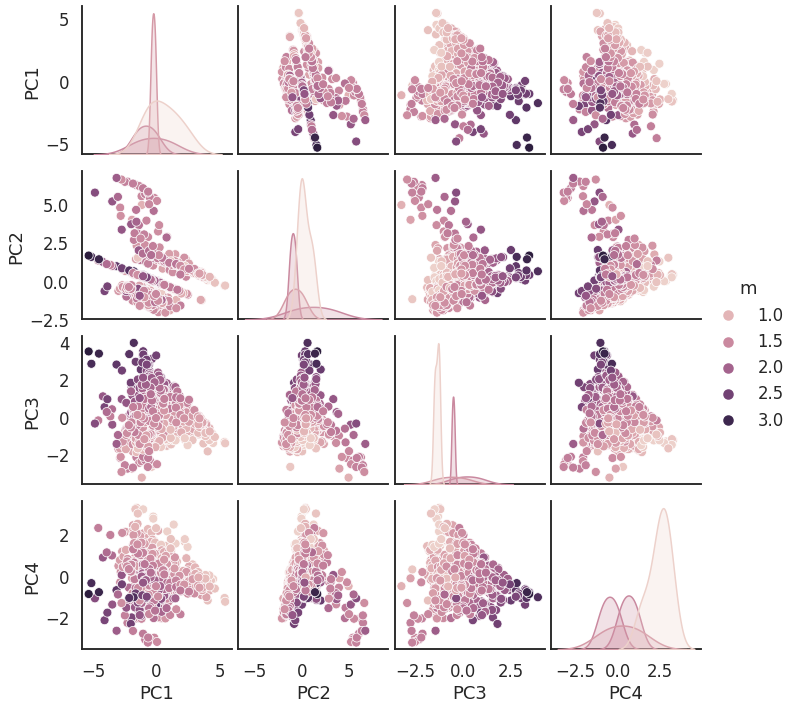

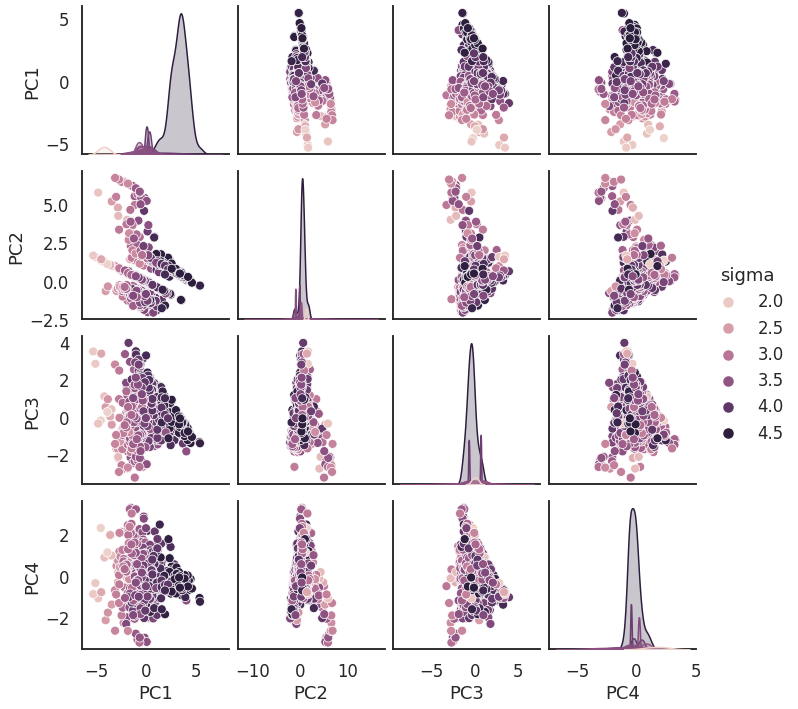

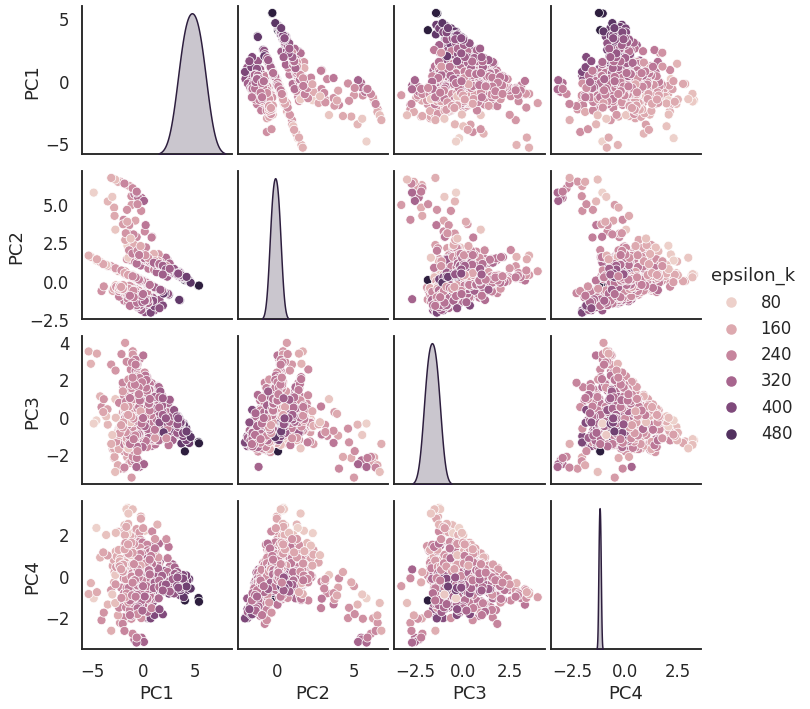

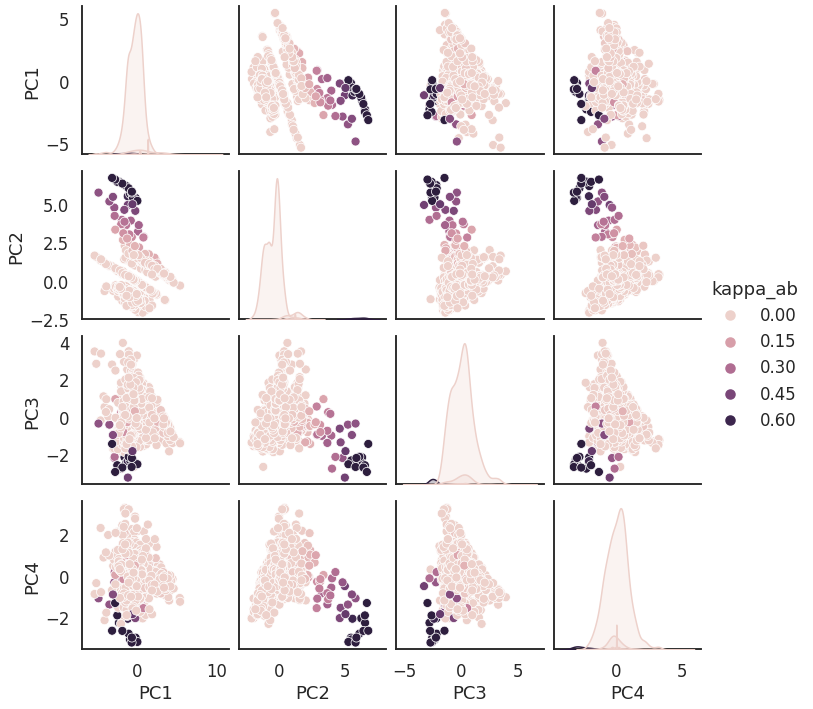

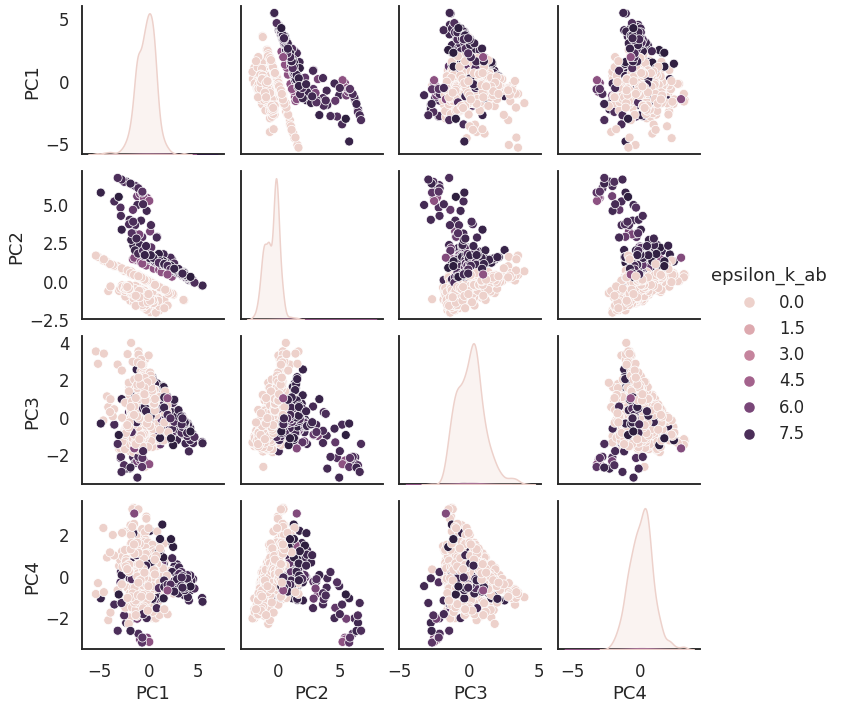

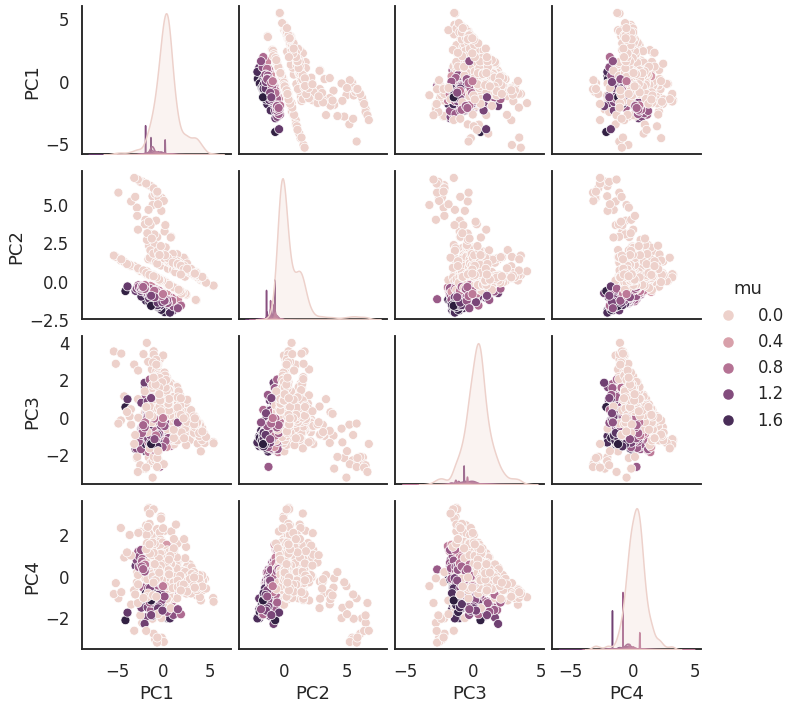

In [37]:
for key in feature_cols:
    visualize( data_PCA, data[key],  label_name=key )

Since the molecular weight plot shows no pattern, it appears to be an association volume dependent subdivision.

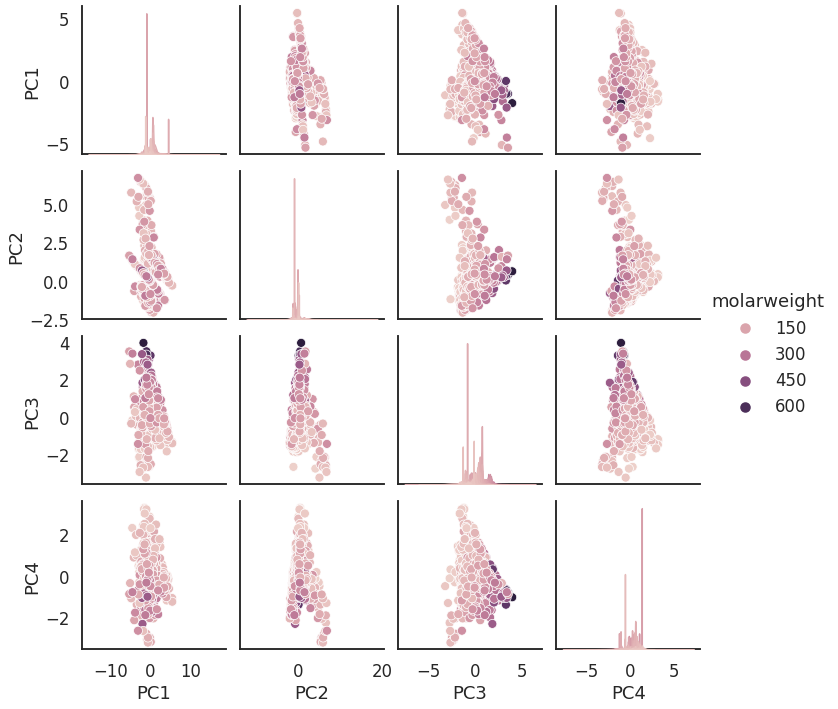

In [38]:

visualize( data_PCA, data["molarweight"],  label_name="molarweight" )

## DBSCAN + kernel PCA

In [39]:

cluster_kPCA = DBSCAN(eps=0.198, min_samples=20,metric='euclidean')
cluster_kPCA.fit(data_kPCA)
print(f'DBSCAN found {len(set(cluster_kPCA.labels_) - set([-1]))} clusters and {(cluster_kPCA.labels_ == -1).sum()} points of noise.')
for lab in np.unique(cluster_kPCA.labels_):
    print( f'{len( cluster_kPCA.labels_[cluster_kPCA.labels_==lab] )} datapoints in cluster {lab}' )
    

DBSCAN found 3 clusters and 115 points of noise.
115 datapoints in cluster -1
374 datapoints in cluster 0
322 datapoints in cluster 1
408 datapoints in cluster 2


The classifier finds three classes:

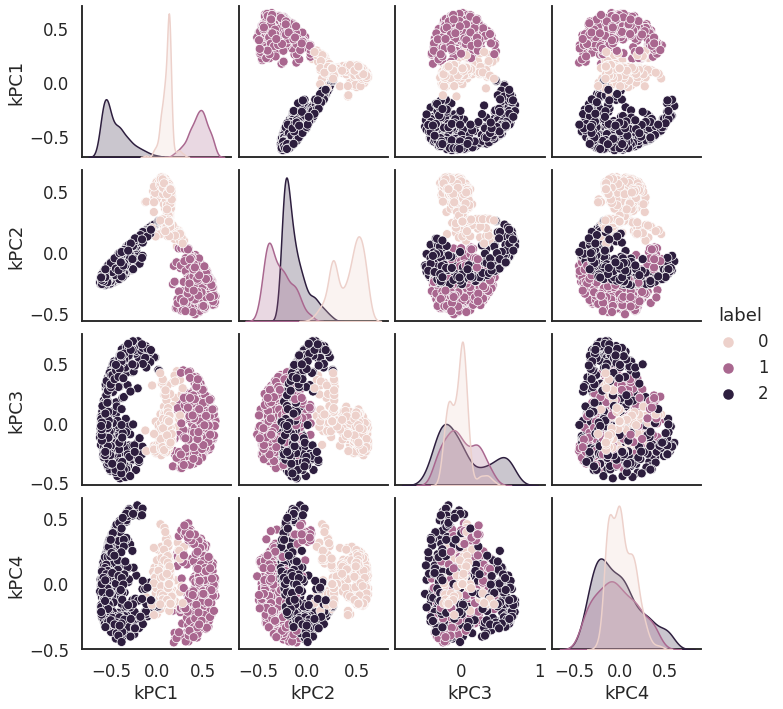

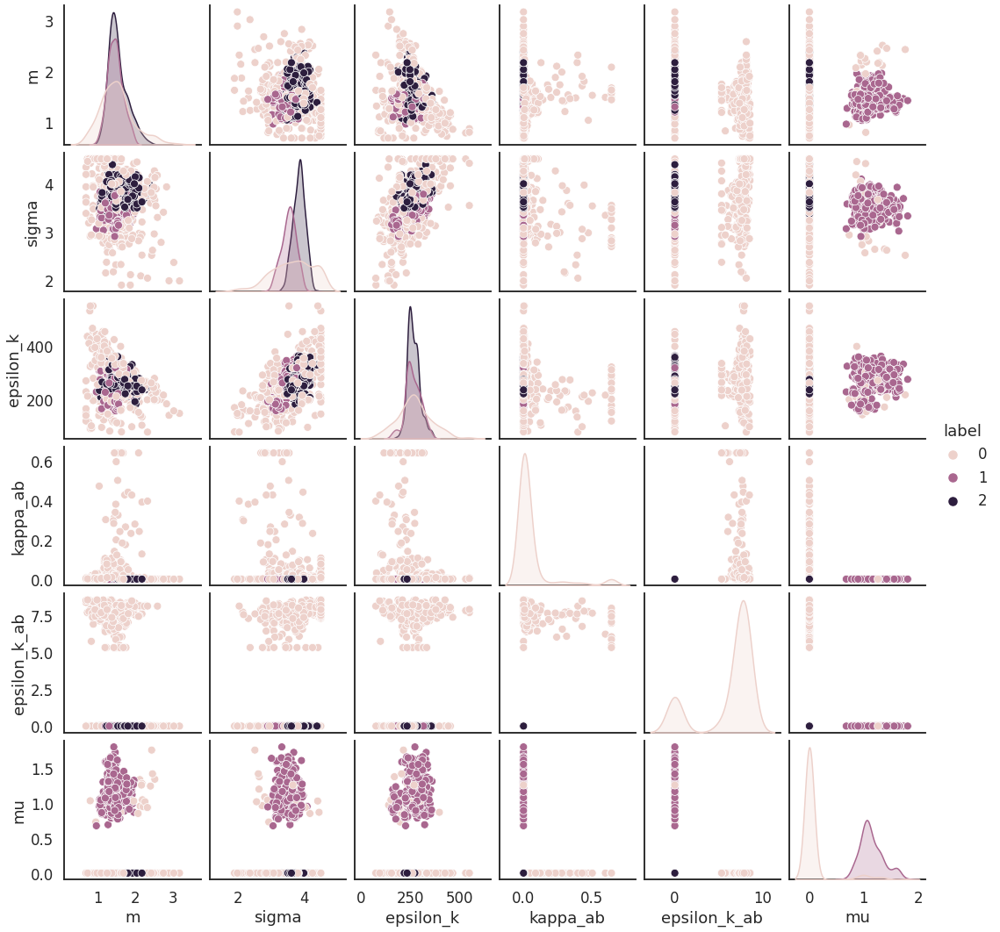

In [40]:
visualize_transformed( data[feature_cols], data_kPCA, cluster_kPCA.labels_ )

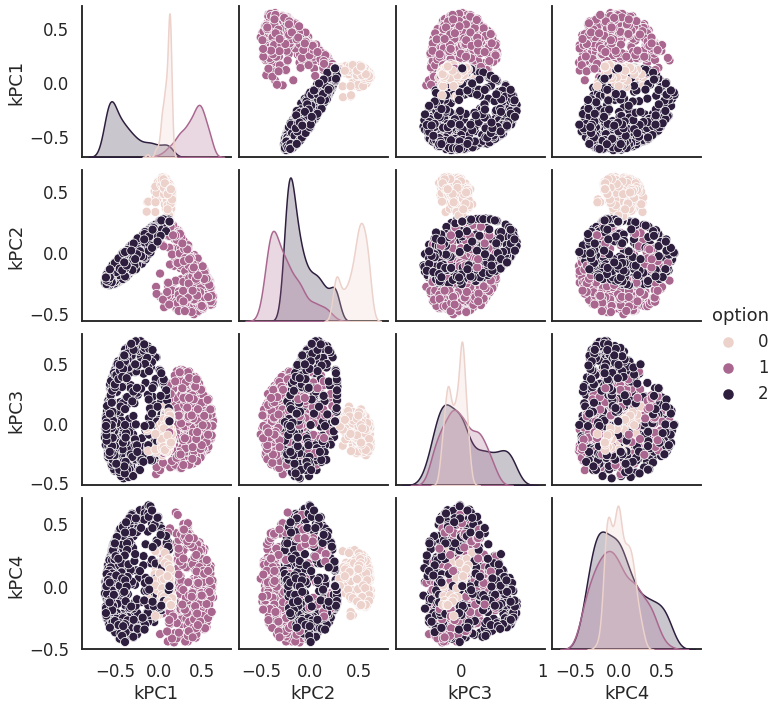

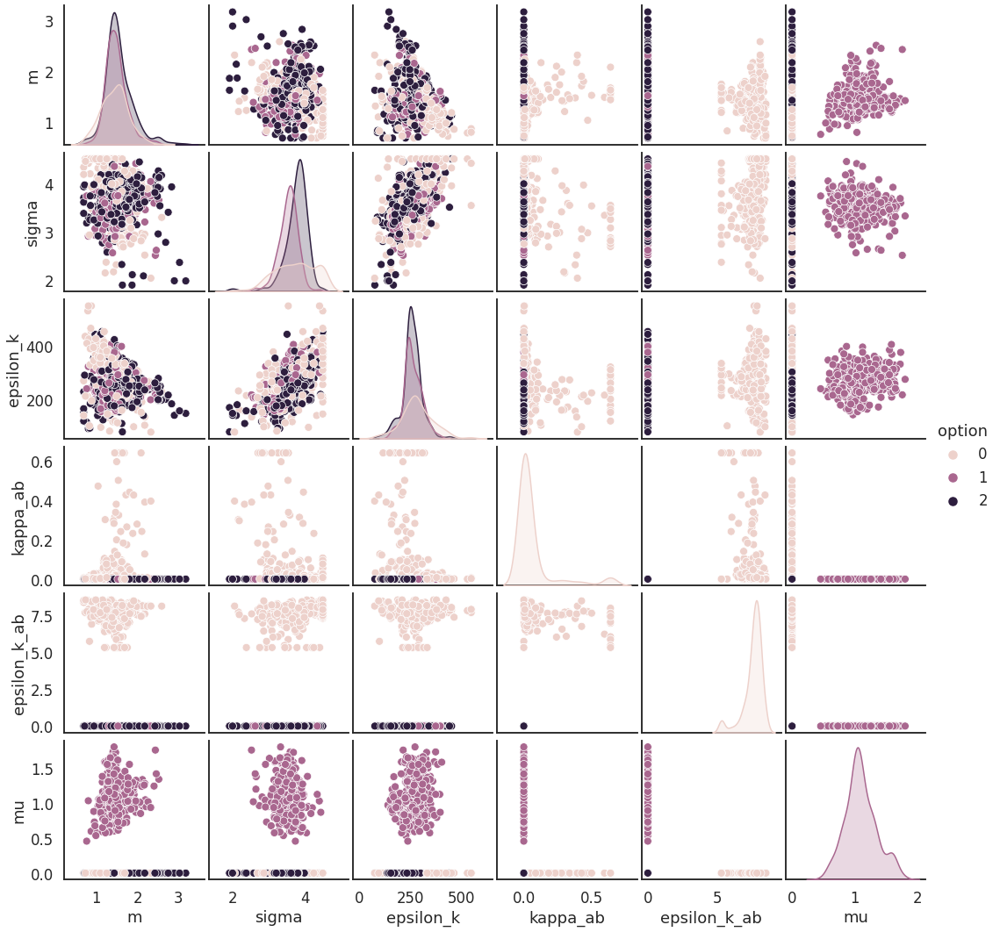

In [41]:
visualize_transformed( data[feature_cols], data_kPCA, data.opt, label_name='option' )

The results of the unsupervised classification in the kernel PCA manifold correspond to those in the main space. In addition, adjusting the hyperparameters is much easier and the result is more robust against changes.

In addition, the results are much easier to interpret if we plot them in the subspace than in the main space i.e. the three classes distinguish between DIPOLAR, ASSOCIATIVE and NONPOLAR substances.

These results are to be expected, as we use the distance trick with the RBF kernel.

# 5. Insights and key findings


In the beginning we asked the following questions and will answer them now:

#### what classification will be found? The dataset offers different options like molecular families, molecule size or chemical features like associating sites or dipoles.

Chemical features are used for classification.

#### is it possible to classify the species based on the given features i.e. parameters of the physical model?

Yes, the classes distinguish between DIPOLAR, ASSOCIATIVE and NONPOLAR substances. In the PCA subspace, ASSOCIATIVE substances are divided into subclasses which seem to be assiociation volume dependent.

#### if dimensionality reduction is helpful for classification. If yes why?

Yes it is. Hyperparameter estimation becomes much easier and less shaky.
In addition, some of the model answers are more refined and therefore more valuable. In general low dimensional spaces easier to interpret.


#### if the classes derived from unsupervised classification agree with one of the available "chemical" classes.

Yes, the unsupervised classification distinguishes between DIPOLAR, ASSOCIATIVE and NONPOLAR substances.

#### can we deduce from the results how the parameters of the physical model were fitted?

Yes, we can be quite sure that during the training of the physical model epsilon_k_ab and kappa_ab were only allowed to be non-zero for ASSOCIATIVE substances whereas mu was only allowed to be non-zero for DIPOLAR substances.





# 6. Next Steps

Based on the results we should be able to build very effective classifiers:

- We can build and test a very low dimensional classifier only using  epsion_k_ab, kappa_ab and mu. Then we can check if we find ASSOCIATIVE subclasses.

- We can build and test a very low dimensional classifier only using  epsion_k_ab and mu.

- We can use one of the known approaches to distinguish between DIPOLAR, ASSOCIATIVE and NONPOLAR. Then we can train unsupervised classifiers on those subgroups. Analysing these subclasses should produce a lot of additional information about the data set (they might be linked to chemical families or something else... no matter what it will be interesting). This would be someting like an classification tree :)


We can use those classifiers to improve the training of the physical model itself. If we got information about the physical substance and to what subclass it belongs, the resulting physical parameters should be classified properly. If not this indicates overfitting or other errors. This should be especially useful when we know subgroups of DIPOLAR, ASSOCIATIVE and NONPOLAR. Maybe these subgroups are linked to chemical families.
